In [1]:
from idstools._config import load_config
from idstools._objects import Target
from idstools.preparation import DataPreparation
from idstools.optimization import ModelOptimization

In [2]:
train_target = Target(
    id=1,
    input_path="data/BikeRentalDaily_train.csv",
    input_delimiter=";",
    label="cnt"
)
test_target = Target(
    id=2,
    input_path="data/BikeRentalDaily_test.csv",
    input_delimiter=";",
    label="cnt"
)

2024-03-02 23:27:45,019 [_objects] [INFO] - Initializing TargetData object.
2024-03-02 23:27:45,021 [_helpers] [INFO] - Reading data from:
/home/davidrmn/Studies/introduction-data-science/data/BikeRentalDaily_train.csv
2024-03-02 23:27:45,025 [_objects] [INFO] - Using id: 1
2024-03-02 23:27:45,026 [_objects] [INFO] - Using label: cnt
2024-03-02 23:27:45,026 [_objects] [INFO] - No index provided.
2024-03-02 23:27:45,026 [_objects] [INFO] - No features provided.
2024-03-02 23:27:45,027 [_objects] [INFO] - No environment name provided.
Using default environment name: SELF_EXECUTED
2024-03-02 23:27:45,027 [_objects] [INFO] - No step name provided.
2024-03-02 23:27:45,027 [_objects] [INFO] - Output path not provided.
Using default output path: /home/davidrmn/Studies/introduction-data-science/results
2024-03-02 23:27:45,028 [_objects] [INFO] - Initializing TargetData object.
2024-03-02 23:27:45,029 [_helpers] [INFO] - Reading data from:
/home/davidrmn/Studies/introduction-data-science/data/B

In [3]:
config = load_config('../config/idstools/DEBUG.yaml')

In [4]:
config

```yaml
DEFAULT: null
PREPROCESSING:
  pipeline:
    _CustomTransformer:
    - func: target_to_datetime
      module: idstools._transformer
      config:
        target: dteday
        format: '%d.%m.%Y'
    - func: impute_season
      module: idstools._transformer
      config:
        target: season
        date: dteday
    - func: negative_to_nan
      module: idstools._transformer
      config:
        target: windspeed
    - func: process_weekday
      module: idstools._transformer
      config:
        target: weekday
        date: dteday
    - func: remove_outliers
      module: idstools._transformer
      config:
        target: casual
    _OneHotEncoder:
    - target: season
      config:
        prefix: season
        dtype: int
        drop_first: true
    - target: weekday
      config:
        prefix: weekday
        dtype: int
        drop_first: true
    - target: weathersit
      config:
        prefix: weathersit
        dtype: int
        drop_first: true
    _NaNDropper:
    - target:
      - windspeed
    _SimpleImputer:
    - target:
      - hum
      config:
        strategy: mean
    _FeatureDropper:
    - target:
      - casual
      - registered
      - temp
      - dteday
      config:
        axis: 1
        errors: ignore
OPTIMIZATION:
  pipeline:
  - id: LazyRegressor
    targets:
    - 1
    model: LazyRegressor
    module: lazypredict.Supervised
    config:
      verbose: 0
      predictions: true
      ignore_warnings: false
      random_state: 42
    split:
      config:
        test_size: 0.2
        random_state: 42
    validation:
      targets:
      - 2
  - id: LinearRegression
    targets:
    - 1
    model: LinearRegression
    module: sklearn.linear_model
    split:
      config:
        test_size: 0.2
        random_state: 42
    validation:
      targets:
      - 2
      methods:
      - mae
      - r2_score
  - id: RandomForestRegressor
    model: RandomForestRegressor
    module: sklearn.ensemble
    param_grid:
      n_estimators:
      - 100
      - 200
      - 300
      max_depth:
      - 10
      - 20
      - 30
      min_samples_split:
      - 2
      - 5
      - 10
      min_samples_leaf:
      - 1
      - 2
      - 4
      bootstrap:
      - true
      - false
      random_state:
      - 42
  - id: XGBRegressor
    model: XGBRegressor
    module: xgboost
    param_grid:
      n_estimators:
      - 100
      - 200
      - 300
      max_depth:
      - 3
      - 4
      - 5
      learning_rate:
      - 0.1
      - 0.01
      - 0.001
      random_state:
      - 42
  - id: ExtraTreesRegressor
    model: ExtraTreesRegressor
    module: sklearn.ensemble
    param_grid:
      n_estimators:
      - 100
      - 200
      - 300
      max_depth:
      - 10
      - 20
      - 30
      min_samples_split:
      - 2
      - 5
      - 10
      min_samples_leaf:
      - 1
      - 2
      - 4
      bootstrap:
      - true
      - false
      random_state:
      - 42
  - id: LinearRegression
    model: LinearRegression
    module: sklearn.linear_model
    param_grid:
      fit_intercept:
      - true
      - false
      copy_X:
      - true
      - false
      positive:
      - true
      - false
  - id: GridSearchCV
    targets:
    - 1
    model: GridSearchCV
    module: sklearn.model_selection
    estimators:
    - RandomForestRegressor
    - XGBRegressor
    - ExtraTreesRegressor
    config:
      cv: 5
      n_jobs: -1
      scoring: r2
    split:
      config:
        test_size: 0.2
        random_state: 42
    validation:
      targets:
      - 2

```

In [5]:
preparation = DataPreparation(targets=[train_target, test_target], pipeline=config.preprocessing.pipeline)

2024-03-02 23:27:45,144 [preparation] [INFO] - Initializing DataPreparation for multiple targets.


In [6]:
preparation.run()

2024-03-02 23:27:45,154 [preparation] [INFO] - Pipeline created:
_CustomTransformer:
- func: target_to_datetime
  module: idstools._transformer
  config:
    target: dteday
    format: '%d.%m.%Y'
- func: impute_season
  module: idstools._transformer
  config:
    target: season
    date: dteday
- func: negative_to_nan
  module: idstools._transformer
  config:
    target: windspeed
- func: process_weekday
  module: idstools._transformer
  config:
    target: weekday
    date: dteday
- func: remove_outliers
  module: idstools._transformer
  config:
    target: casual
_OneHotEncoder:
- target: season
  config:
    prefix: season
    dtype: int
    drop_first: true
- target: weekday
  config:
    prefix: weekday
    dtype: int
    drop_first: true
- target: weathersit
  config:
    prefix: weathersit
    dtype: int
    drop_first: true
_NaNDropper:
- target:
  - windspeed
_SimpleImputer:
- target:
  - hum
  config:
    strategy: mean
_FeatureDropper:
- target:
  - casual
  - registered
  -

In [7]:
optimization = ModelOptimization(targets=[train_target, test_target], pipeline=config.optimization.pipeline)

2024-03-02 23:27:45,207 [optimization] [INFO] - Initializing ModelOptimization


2024-03-02 23:27:45,212 [optimization] [INFO] - Running model optimization pipeline.
2024-03-02 23:27:45,213 [optimization] [INFO] - Retrieving model LazyRegressor.
2024-03-02 23:27:45,388 [optimization] [INFO] - Preparing target for LazyRegressor.
2024-03-02 23:27:45,392 [optimization] [INFO] - Performed splitting for BikeRentalDaily_train
Training set: 473 samples
Testing set: 119 samples
2024-03-02 23:27:45,392 [optimization] [INFO] - Prepare validation data BikeRentalDaily_test for LazyRegressor.
2024-03-02 23:27:45,393 [optimization] [INFO] - Fitting BikeRentalDaily_train for LazyRegressor.
 74%|███████▍  | 31/42 [00:03<00:01,  6.26it/s]

QuantileRegressor model failed to execute
Solver interior-point is not anymore available in SciPy >= 1.11.0.


100%|██████████| 42/42 [00:04<00:00,  9.61it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 834
[LightGBM] [Info] Number of data points in the train set: 473, number of used features: 19
[LightGBM] [Info] Start training from score 4449.828753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:


2024-03-02 23:27:51,647 [optimization] [INFO] - Predicting target BikeRentalDaily_test for LazyRegressor.
2024-03-02 23:27:51,648 [optimization] [INFO] - No predict method found for model LazyRegressor.
2024-03-02 23:27:51,668 [optimization] [INFO] - Retrieving model LinearRegression.
2024-03-02 23:27:51,669 [optimization] [INFO] - Preparing target for LinearRegression.
2024-03-02 23:27:51,672 [optimization] [INFO] - Performed splitting for BikeRentalDaily_train
Training set: 473 samples
Testing set: 119 samples
2024-03-02 23:27:51,672 [optimization] [INFO] - Prepare validation data BikeRentalDaily_test for LinearRegression.
2024-03-02 23:27:51,673 [optimization] [INFO] - Fitting BikeRentalDaily_train for LinearRegression.
2024-03-02 23:27:51,676 [optimization] [INFO] - Predicting target BikeRentalDaily_test for LinearRegression.
2024-03-02 23:27:51,714 [optimization] [INFO] - Validating model LinearRegression with method mae.
2024-03-02 23:27:51,715 [optimization] [INFO] - Calculatin

Mean absolute error for model LinearRegression with validation target BikeRentalDaily_test is 640.8134414722258.
R2 score for model LinearRegression with validation target BikeRentalDaily_test is 0.8017111167917694.


2024-03-02 23:28:45,637 [optimization] [INFO] - Predicting target BikeRentalDaily_test for GridSearchCV.


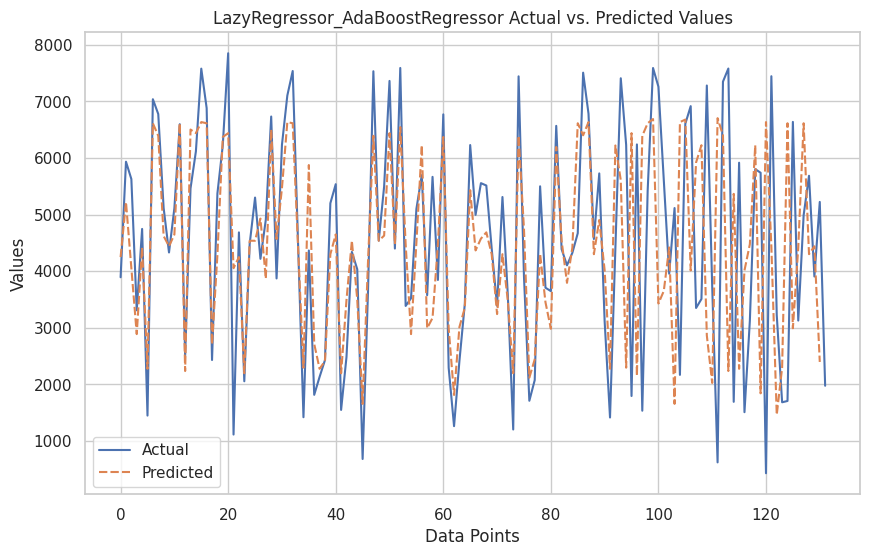

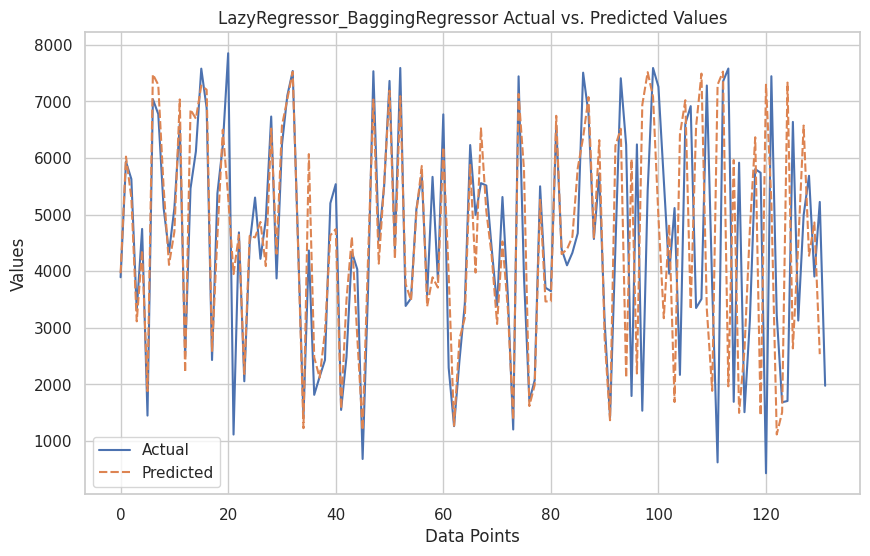

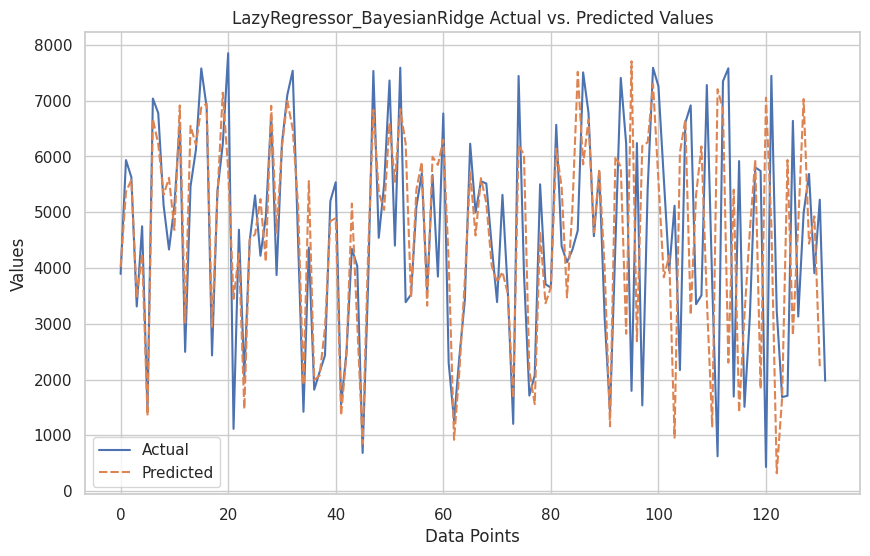

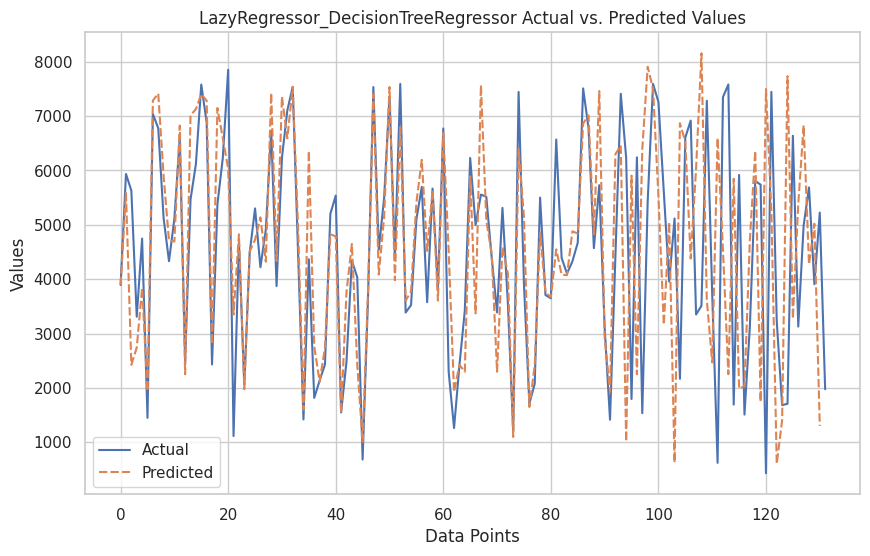

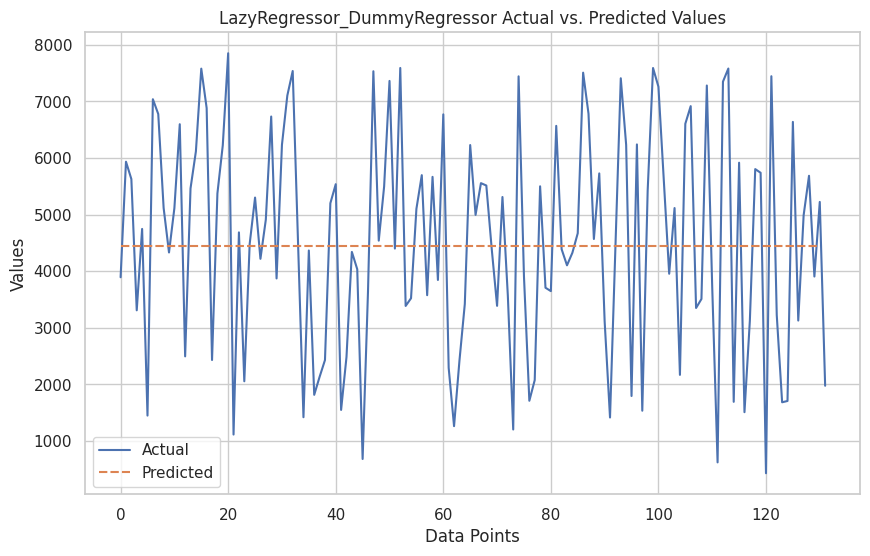

...

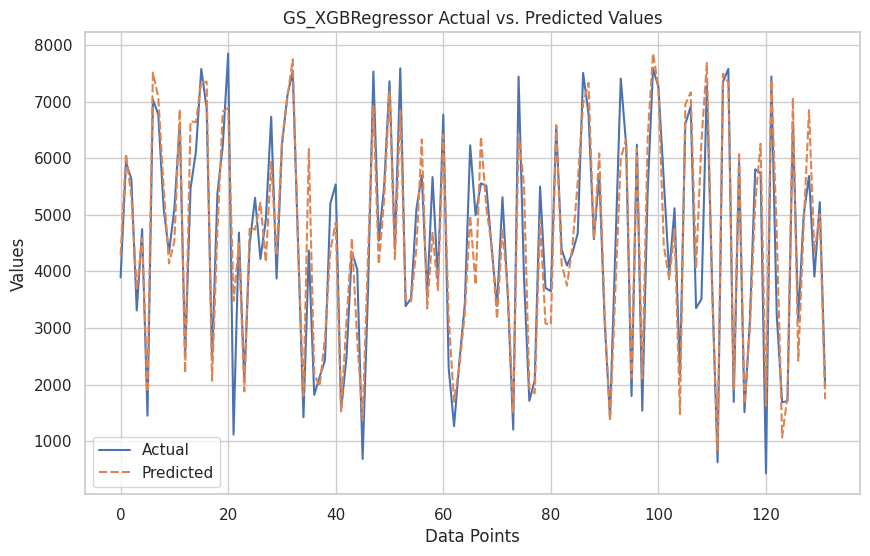

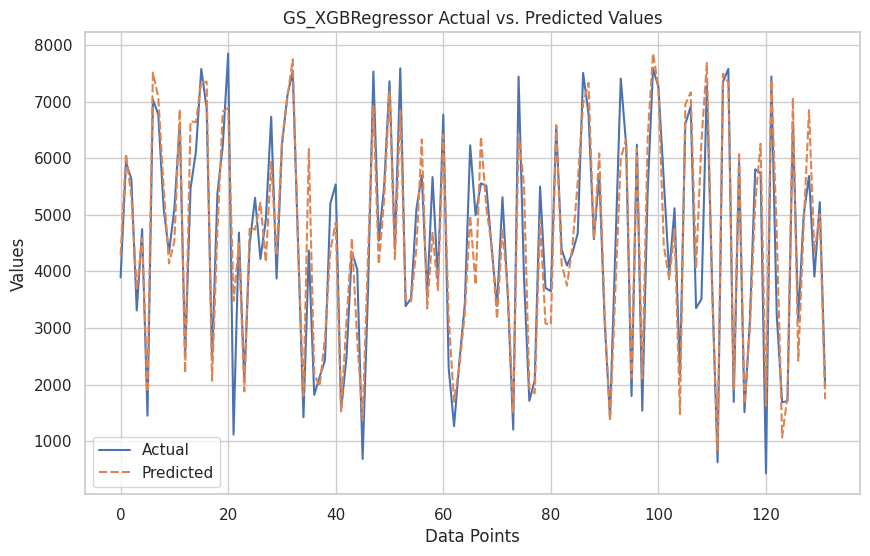

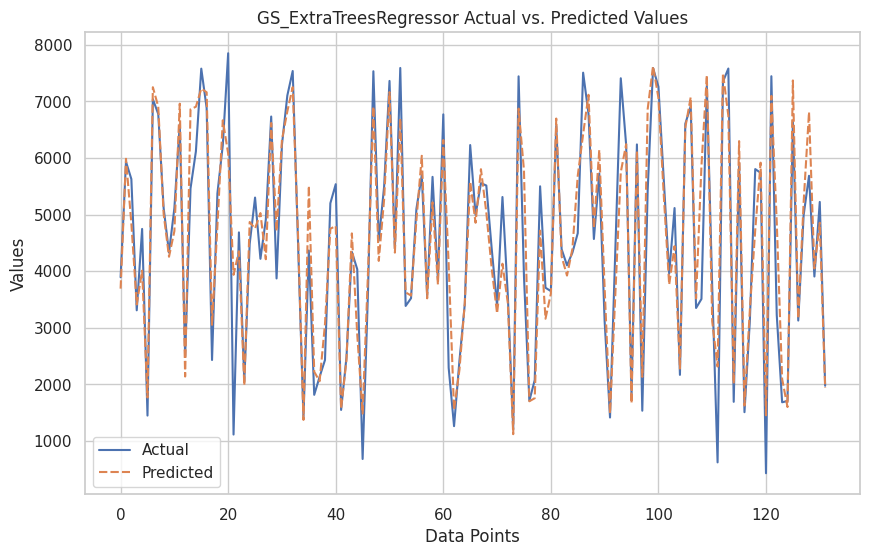

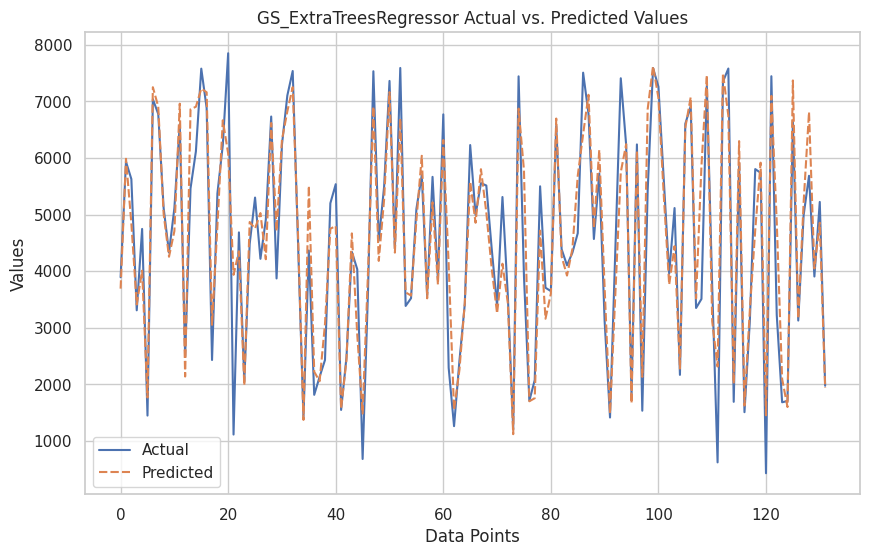

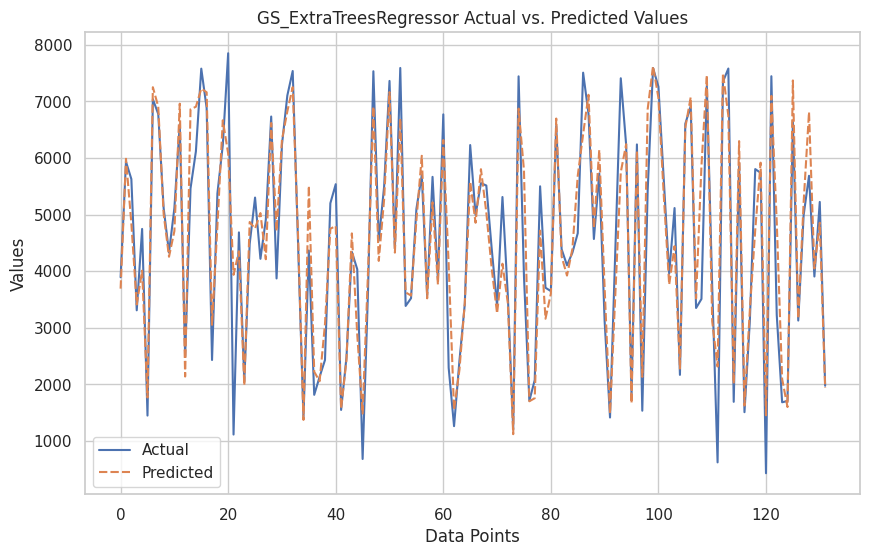

In [8]:
optimization.run()

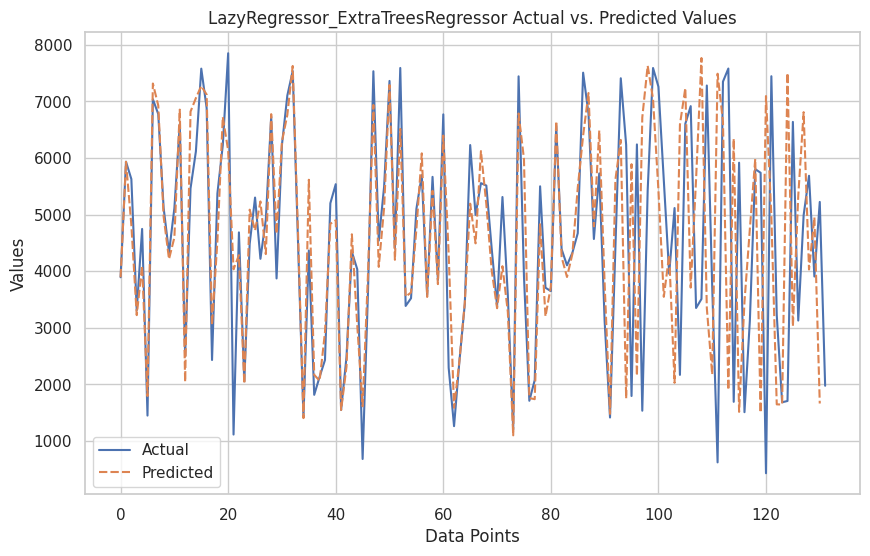

In [9]:
test_target.figures['LazyRegressor_ExtraTreesRegressor_actual_vs_predicted']

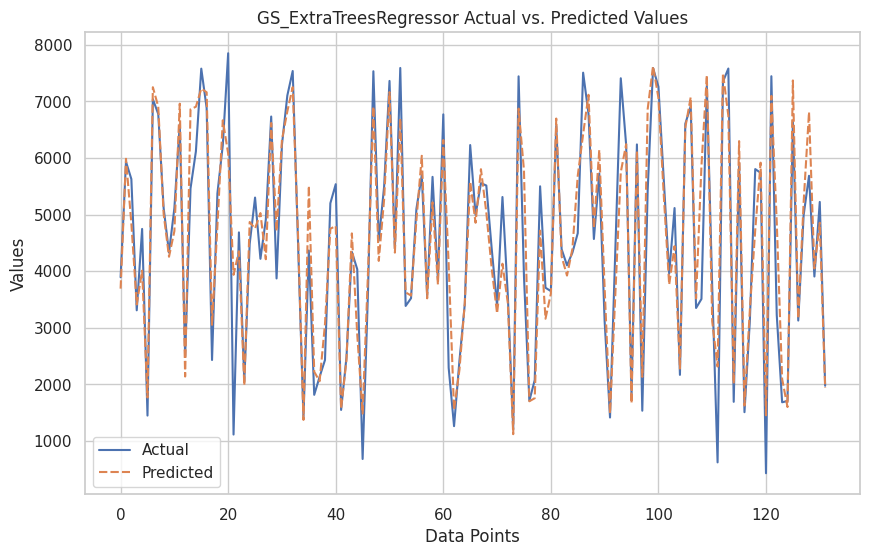

In [10]:
test_target.figures['GS_ExtraTreesRegressor_actual_vs_predicted']

In [11]:
test_target.analysis_results.keys()

dict_keys(['LinearRegression', 'GridSearchCV'])

In [13]:
test_target.analysis_results['LinearRegression']['r2_score']

0.8017111167917694

In [14]:
test_target.analysis_results['LinearRegression']['mae']

640.8134414722258